<a href="https://colab.research.google.com/github/Alfonso-Garibay/computer-vision-course-Equipo-15/blob/main/3_sobel_canny_edge_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Team # 15**
* Manuel Alemán Cueto A01794894
* Emmanuel Domínguez Bravo A01793683
* Alfonso Garibay Flores A01224167
* Zmaltzin Paola Godinez Juárez A01794538
* Luis Angel Hermenegildo Dominguez A01793625

# 3. Sobel and Canny Edge Detection

## Table of Contents
1. [Libraries](#libraries)
2. [Sobel Edge Detection](#sobel)
3. [Canny Edge Detection](#canny)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import skimage
import numpy as np
from scipy import ndimage
from skimage import exposure
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage.filters import convolve
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med

/var/folders/vv/79fy70ts56l7_wt8cgwk_qy40000gn/T/ipykernel_62056/29601034.py:9: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve
/var/folders/vv/79fy70ts56l7_wt8cgwk_qy40000gn/T/ipykernel_62056/29601034.py:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter as gauss
/var/folders/vv/79fy70ts56l7_wt8cgwk_qy40000gn/T/ipykernel_62056/29601034.py:11: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import median_filter as med


## Sobel Edge Detection <a class="anchor" id="sobel" ></a>

As a first step in extracting features, you will apply the Sobel edge detection algorithm. This finds regions of the image with large gradient values in multiple directions. Regions with high omnidirectional gradient are likely to be edges or transitions in the pixel values.

The code in the cell below applies the Sobel algorithm to the median filtered image, using these steps:

1. Convert the color image to grayscale for the gradient calculation since it is two dimensional.
2. Compute the gradient in the x and y (horizontal and vertical) directions.
3. Compute the magnitude of the gradient.
4. Normalize the gradient values.

In [2]:
def edge_sobel(image):
    from scipy import ndimage
    import skimage.color as sc
    import numpy as np
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

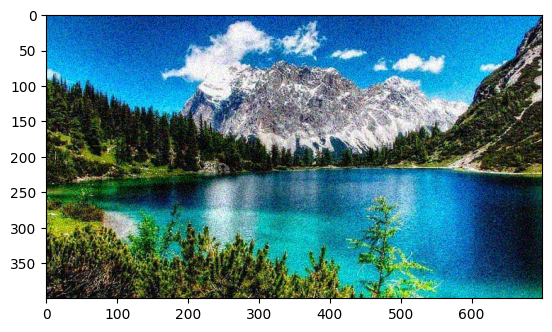

In [4]:
original_image = np.load('data/img.npy')

img = skimage.util.random_noise(original_image)
plt.imshow(img)

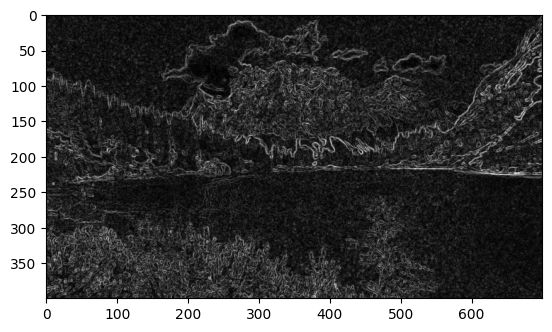

In [5]:
img_med = med(img, size=2)
img_edge = edge_sobel(img_med)
plt.imshow(img_edge, cmap="gray")

Now let's try with the more blurred gaussian filtered image.

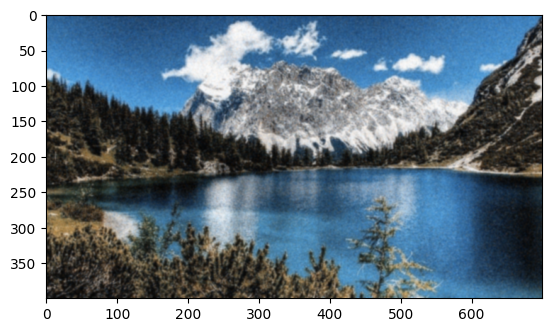

In [6]:
img_gauss = gauss(img, sigma=1)
plt.imshow(img_gauss)

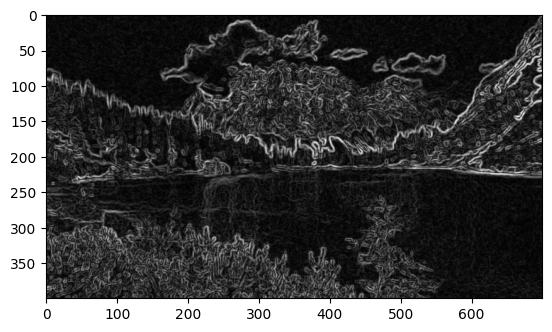

In [7]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")

## Canny Edge Detection <a class="anchor" id="canny" ></a>

Steps:
1. Noise Reduction
2. Gradient Calculation
3. Non-maximum Supression
4. Double Threshold
5. Edge Tracking by Hysteresis

**Pre-requisite:** Convert the image to grayscale before algorithm.

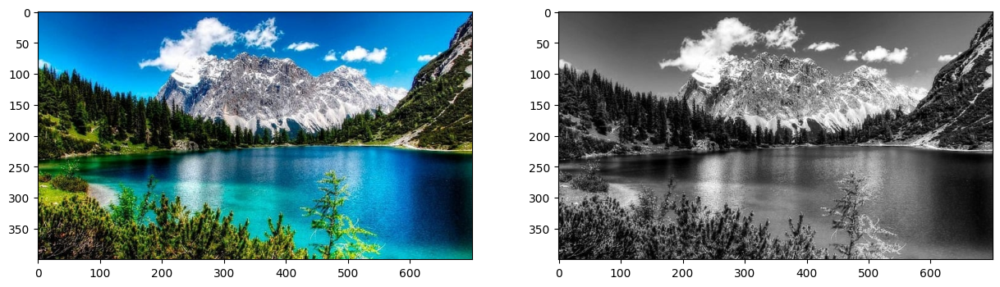

In [8]:
img = cv2.imread('data/image.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### 1. Noise Reduction
Edge detection are highly sensitive to image noise due to the derivatives behind the algorithm.

We can apply a Gaussian Kernel, the size of the kernel depends on the expected blurring effect. The smaller the less blurring effect.

Equation for Gaussian Kernel of size $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [9]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

### 1.1 Sigma Parameter $\sigma$

In [10]:
# Change this parameter
sigma = 10 # 1, 3, 5, 10, 20, ...

### 1.2 Kernel Size Parameter

In [11]:
kernel_size = 3

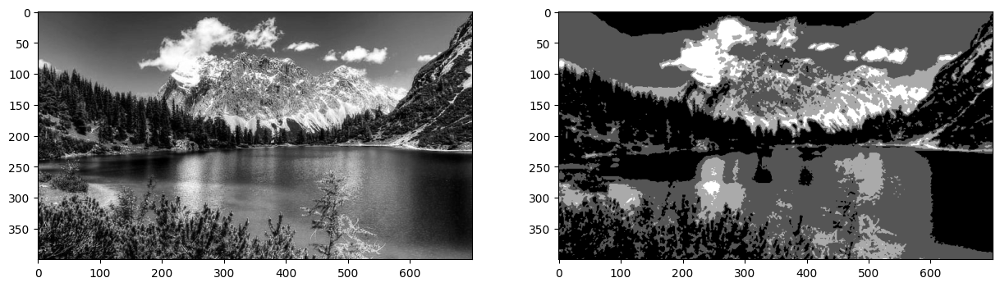

In [12]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

### 2. Gradient Calculation

Edges correspond to a change of pixels intensity.

To detect it, the easiest way is to apply filters that highlight this intensity change in both directions:
- horizontal $(x)$
- and vertical $(y)$

It can be implemented by convoling $I$ with *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

In [13]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)

    return (G, theta)

/var/folders/vv/79fy70ts56l7_wt8cgwk_qy40000gn/T/ipykernel_62056/3134136643.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
/var/folders/vv/79fy70ts56l7_wt8cgwk_qy40000gn/T/ipykernel_62056/3134136643.py:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)


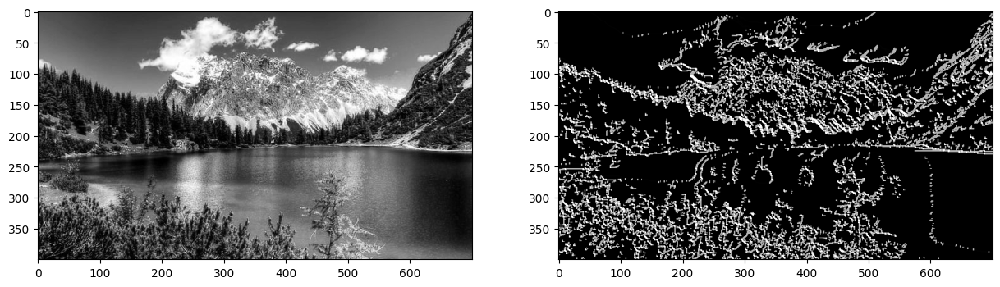

In [14]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(G, cmap="gray")

### 3. Non-Maximum supression

1. Create a matrix initialized to 0 of the same size of the original gradient intensity matrix
2. Identify the edge direction based on the angle value from the angle matrix
3. Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed
4. Return the image processed with the non-max suppression algorithm.

In [15]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180


    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255

               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass

    return Z

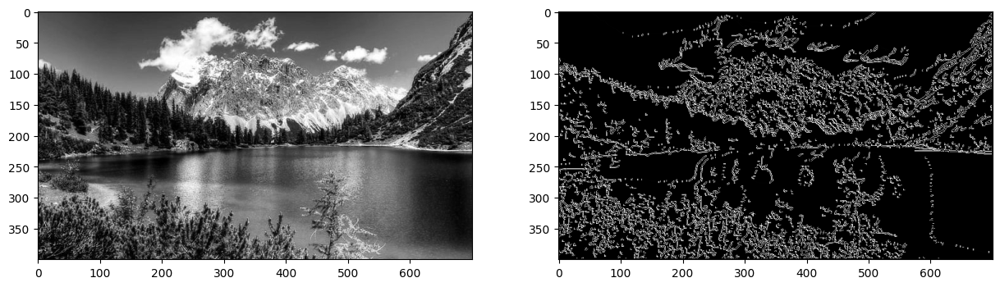

In [16]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")

### 4. Double threshold

- Strong pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
- Weak pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
- Other pixels are considered as non-relevant for the edge.

In [17]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):

    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;

    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)

    weak = np.int32(25)
    strong = np.int32(255)

    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)

    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return (res)

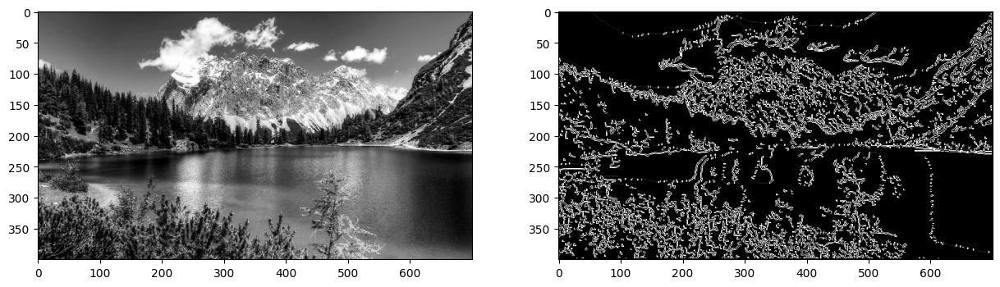

In [18]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")

### 5. Edge Tracking by Hysteresis

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [19]:
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

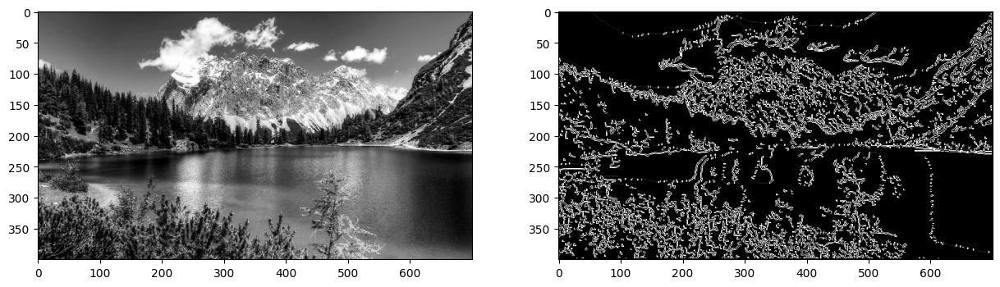

In [20]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")

#Extracción de líneas con algoritmo de Canny
## a) Modifica el valor de sigma y observa los cambios en las lineas detectadas

<ipython-input-7-58755cae58d6>:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
<ipython-input-7-58755cae58d6>:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)
<ipython-input-7-58755cae58d6>:9: RuntimeWarning: invalid value encountered in divide
  G = G / G.max() * 255


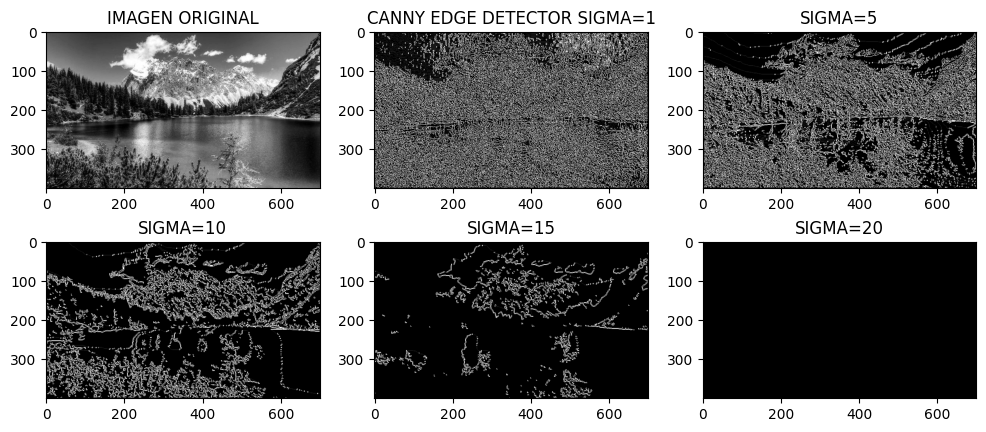

In [ ]:
# Testing sigma=1
sigma = 1
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
G, theta = sobel_filters(img_gaussian)
img_nonmax = non_max_suppression(G, theta)
img_threshold = threshold(img_nonmax)
img_final_s1 = hysteresis(img_threshold)

# Testing sigma=5
sigma = 5
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
G, theta = sobel_filters(img_gaussian)
img_nonmax = non_max_suppression(G, theta)
img_threshold = threshold(img_nonmax)
img_final_s5 = hysteresis(img_threshold)

# Testing sigma=15
sigma = 15
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
G, theta = sobel_filters(img_gaussian)
img_nonmax = non_max_suppression(G, theta)
img_threshold = threshold(img_nonmax)
img_final_s15 = hysteresis(img_threshold)

# Testing sigma=20
sigma = 20
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
G, theta = sobel_filters(img_gaussian)
img_nonmax = non_max_suppression(G, theta)
img_threshold = threshold(img_nonmax)
img_final_s20 = hysteresis(img_threshold)

# Mostrar la imagen original y las diferentes pruebas de sigma
titles = ['IMAGEN ORIGINAL','CANNY EDGE DETECTOR SIGMA=1','SIGMA=5','SIGMA=10','SIGMA=15','SIGMA=20']
images = [img_gray, img_final_s1, img_final_s5, img_final, img_final_s15, img_final_s20]
n = np.arange(6)

fig = plt.figure(figsize=(12, 5))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])
plt.show()

#### COMENTARIOS ACERCA DE LA PRUEBA DE SIGMA

En la técnica de detección de líneas de Canny, sigma se desempeña como un parametro que controla la cantidad de líneas a detectar de la imagen: valores grandes de sigma producen un menor número de líneas a incluir en el resultado y valores pequeños de sigma producen una mayor cantidad de líneas, es decir se integra más detalle al resultado mediante la inclusión de líneas finas. Los valores grandes de sigma también dan como resultado una mayor supresión de ruido, sin embargo también puede afectar el resultado al perder información valiosa.


# b) Analiza el comportamiento del Canny Detector con y sin remoción de ruido

<ipython-input-16-dddc2aedcd55>:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
<ipython-input-16-dddc2aedcd55>:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)


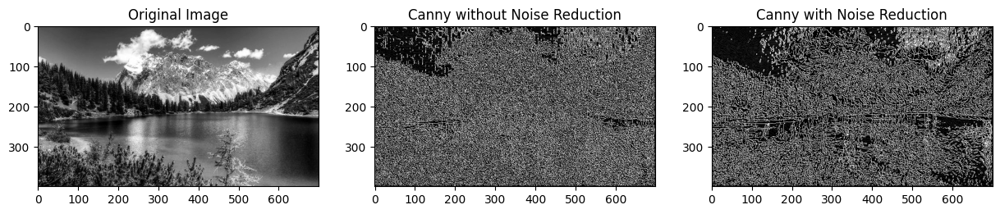

In [25]:
# Reutilizamos las funciones gaussian_kernel, sobel_filters, non_max_suppression, threshold, y hysteresis definidas previamente.

# Aplicación del Canny Edge Detector sin remoción de ruido
def canny_edge_detector_no_noise_reduction(image_gray):
    G, theta = sobel_filters(image_gray)
    img_nonmax = non_max_suppression(G, theta)
    img_threshold = threshold(img_nonmax)
    img_final = hysteresis(img_threshold)
    return img_final

# Aplicación del Canny Edge Detector con remoción de ruido
def canny_edge_detector_with_noise_reduction(image_gray, sigma=1, kernel_size=5):
    img_gaussian = convolve(image_gray, gaussian_kernel(kernel_size, sigma))
    G, theta = sobel_filters(img_gaussian)
    img_nonmax = non_max_suppression(G, theta)
    img_threshold = threshold(img_nonmax)
    img_final = hysteresis(img_threshold)
    return img_final


# Aplicar el detector de bordes Canny sin y con remoción de ruido
img_canny_no_noise_reduction = canny_edge_detector_no_noise_reduction(img_gray)
img_canny_with_noise_reduction = canny_edge_detector_with_noise_reduction(img_gray, sigma=2, kernel_size=5)

# Visualizar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(img_canny_no_noise_reduction, cmap='gray')
plt.title('Canny without Noise Reduction')

plt.subplot(1, 3, 3)
plt.imshow(img_canny_with_noise_reduction, cmap='gray')
plt.title('Canny with Noise Reduction')

plt.show()


**Comentarios acerca del comportamiento del Canny Detector con y sin remoción de ruido**

Al correr el código para analizar el comportamiento del Canny Edge Detector con y sin remoción de ruido, se observan diferencias significativas en los resultados obtenidos. La versión sin remoción de ruido tiende a producir imágenes con una cantidad mayor de bordes detectados, incluyendo aquellos causados por variaciones menores en la intensidad de la imagen o por ruido. Esto puede resultar en una imagen final más "ruidosa" o con detalles finos que, aunque precisos, pueden no ser relevantes para la interpretación general de la estructura de la imagen. En contraste, aplicar el Canny Edge Detector después de un filtro gaussiano para la remoción de ruido genera imágenes con bordes más suavizados y definidos, eliminando una gran parte del ruido y destacando las características más importantes de la imagen.

La remoción de ruido antes de la detección de bordes ayuda a enfocarse en las transiciones significativas de intensidad, lo que es crucial para aplicaciones donde la precisión de los bordes detectados es más importante que la conservación de los detalles mínimos. Este enfoque reduce la probabilidad de detectar falsos positivos (es decir, bordes detectados erróneamente como resultado del ruido). Por lo tanto, la elección entre utilizar o no la remoción de ruido previa depende del contexto específico de la aplicación y de si la prioridad es maximizar la detección de detalles finos o la identificación robusta de características estructurales significativas en la imagen.

# c) Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo

In [53]:
def plot_imges(img1, img2, title1, title2, cmap1=None, cmap2=None):
    plt.figure(figsize=(15,8))
    plt.subplot(1, 2, 1)
    plt.title(title1)
    plt.imshow(img1, cmap=cmap1)
    plt.subplot(1, 2, 2)
    plt.title(title2)
    plt.imshow(img2, cmap=cmap2)

/var/folders/vv/79fy70ts56l7_wt8cgwk_qy40000gn/T/ipykernel_62056/3134136643.py:5: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Ix = ndimage.filters.convolve(img, Kx)
/var/folders/vv/79fy70ts56l7_wt8cgwk_qy40000gn/T/ipykernel_62056/3134136643.py:6: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Iy = ndimage.filters.convolve(img, Ky)


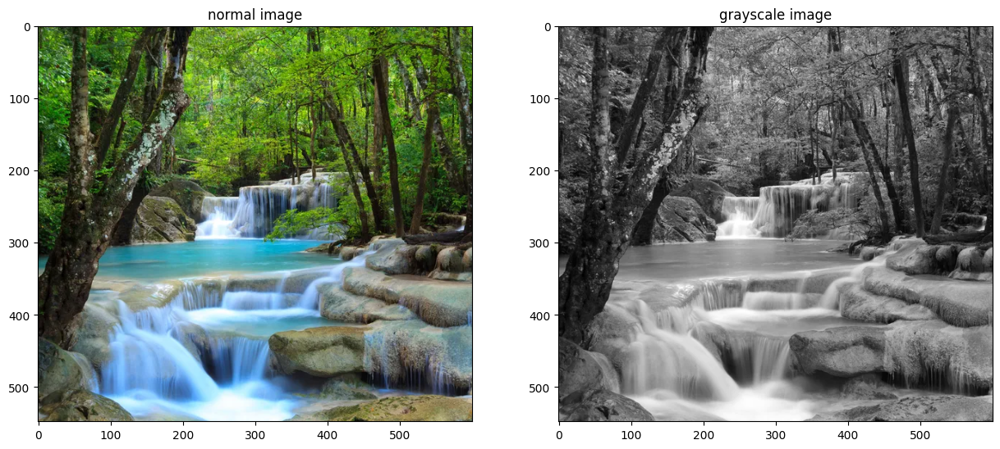

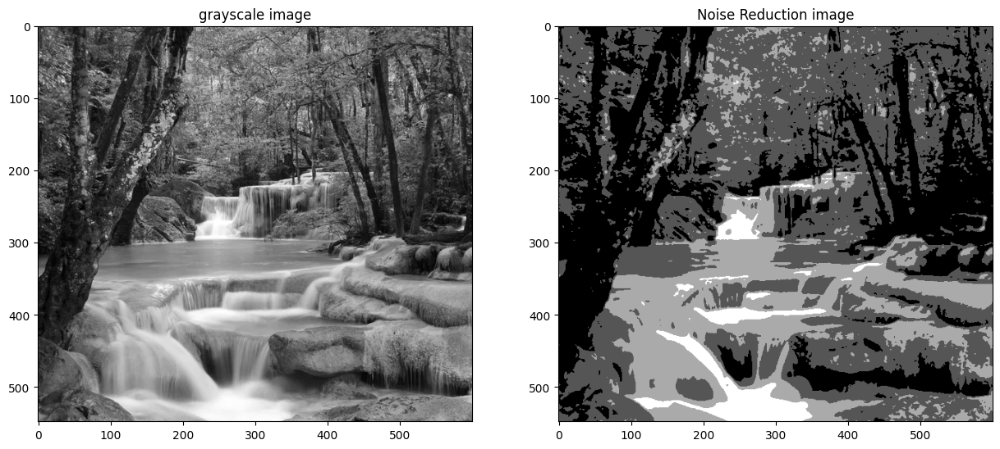

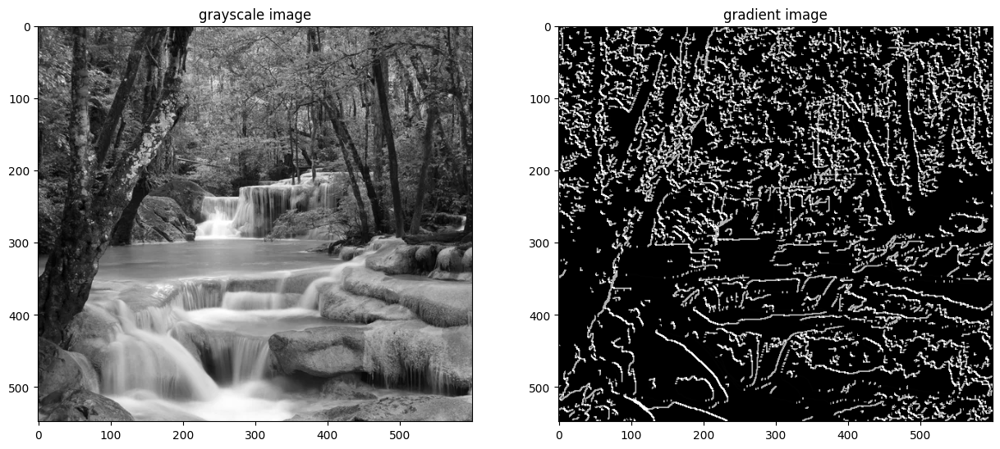

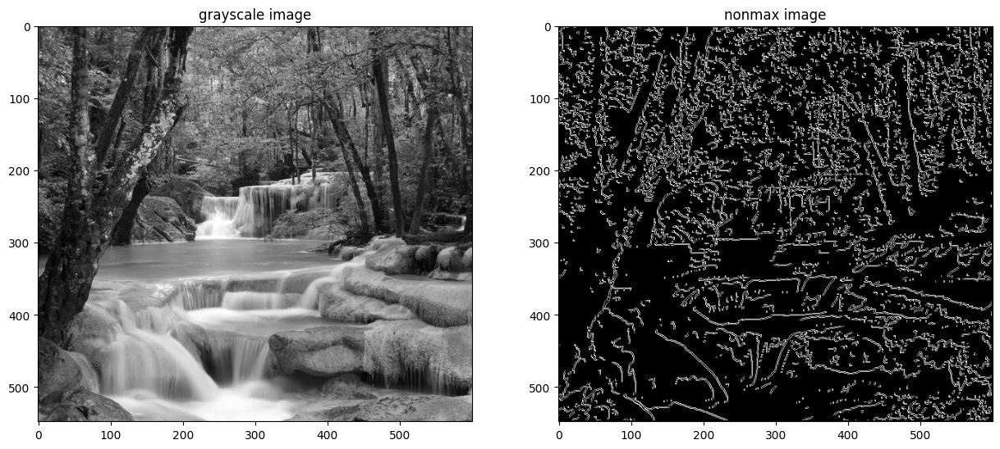

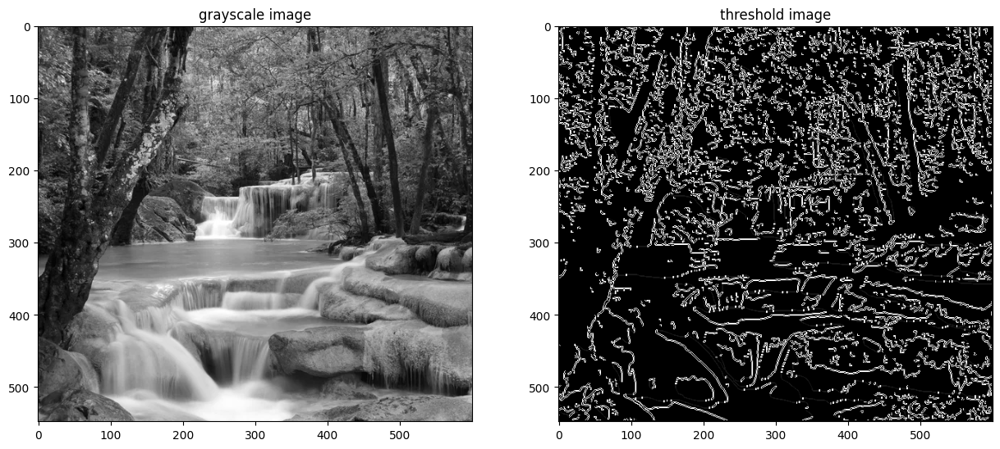

...

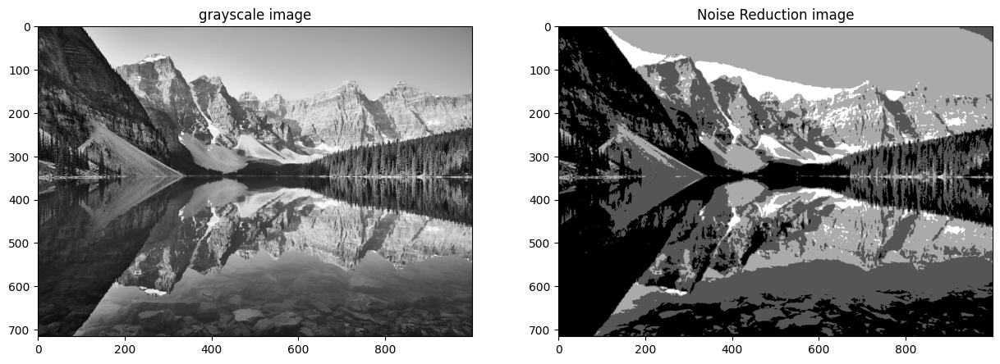

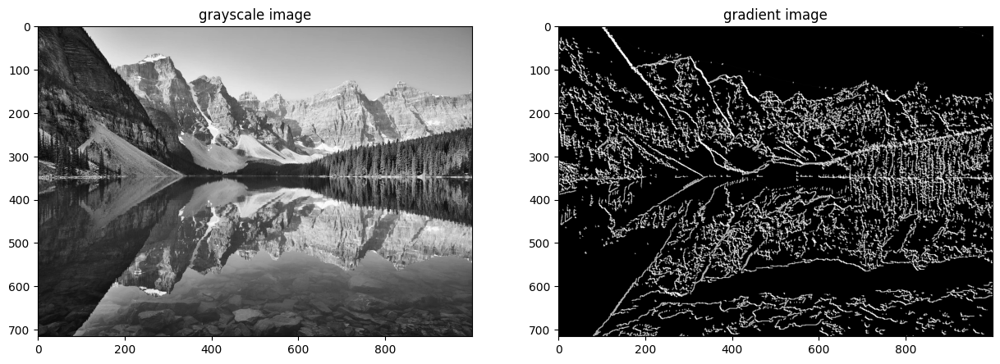

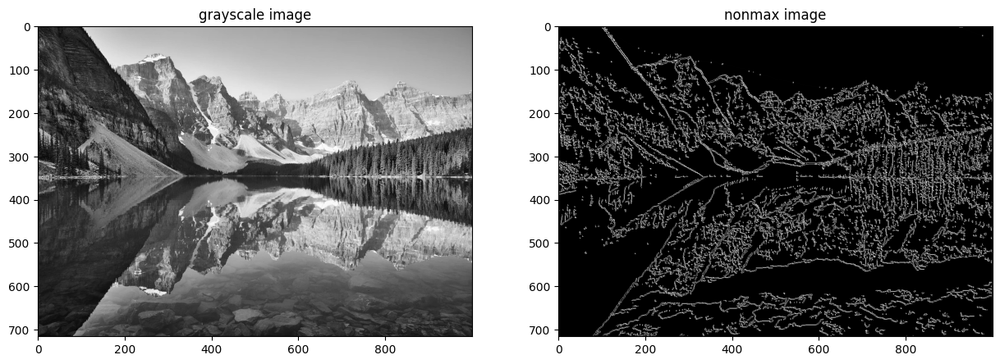

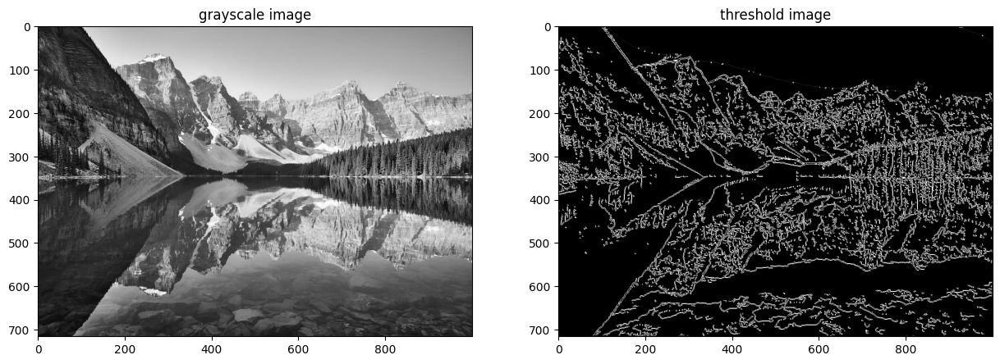

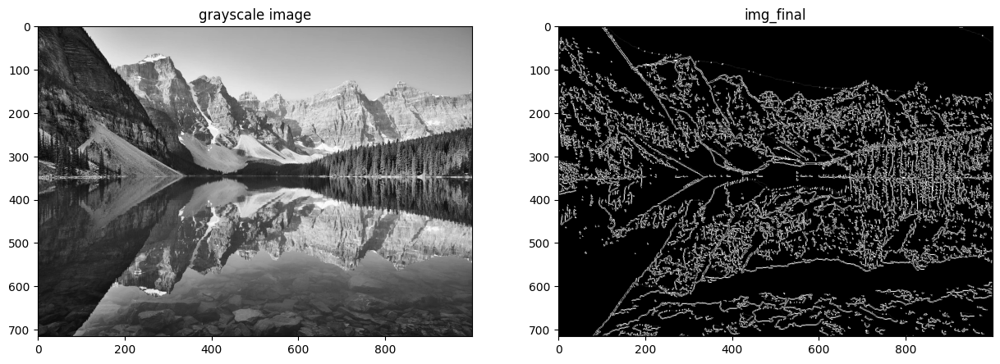

In [64]:
images = ['paisaje1.jpg','paisaje2.jpg','paisaje3.jpg']
# read and show the images inside the images list the path start with data/
for i in images:
    img = cv2.imread(f'data/{i}')
    img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    plot_imges(img_color, img_gray, 'normal image', 'grayscale image', cmap2='gray')

    # Noise Reduction

    sigma = 10
    kernel_size = 3
    img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
    plot_imges(img_gray, img_gaussian, 'grayscale image', 'Noise Reduction image',cmap1='gray', cmap2='gray')

    # Gradient Calculation
    G, theta = sobel_filters(img_gaussian)
    plot_imges(img_gray, G, 'grayscale image', 'gradient image',cmap1='gray', cmap2='gray')

    # Non Maximum supression
    img_nonmax = non_max_suppression(G, theta)
    plot_imges(img_gray, img_nonmax, 'grayscale image', 'nonmax image', cmap1='gray', cmap2='gray')

    # Double threshold
    img_threshold = threshold(img_nonmax)
    plot_imges(img_gray, img_threshold, 'grayscale image', 'threshold image', cmap1='gray', cmap2='gray')

    # Edge tracking by hysteresis
    img_final = hysteresis(img_threshold)
    plot_imges(img_gray, img_final, 'grayscale image', 'img_final', cmap1='gray', cmap2='gray')
    

Se observa que el preprocesamiento y la calibración de parámetros juegan un papel crucial en la eficacia de la detección de bordes. A través de la implementación práctica, se hizo evidente que la aplicación de un filtro gaussiano antes de la detección de bordes es fundamental para atenuar el ruido y evitar la detección de falsos positivos. La convolución de la imagen con un kernel gaussiano actúa como un paso de suavizado que favorece la continuidad y la prominencia de los bordes reales sobre las fluctuaciones aleatorias de intensidad.

Al proceder con el algoritmo, la aplicación de los filtros de Sobel para obtener las magnitudes y direcciones del gradiente demostró ser eficiente para la estimación de bordes. Sin embargo, sin la supresión de no máximos, la imagen resultante todavía contenía múltiples respuestas al borde, lo que subraya la importancia de este paso para afinar los resultados.

El threshold y la histeresis, aunque son pasos adicionales, refinaron aún más los bordes, diferenciando entre los verdaderamente significativos y aquellos que probablemente son producto del ruido o de variaciones menores en la intensidad.